# Load post and reviews data from Inside Airbnb

In [7]:
import pandas as pd

list_path = 'data/listings.csv.gz' # list of Airbnb posts

df_list = pd.read_csv(list_path, compression='gzip')
print(len(df_list))
display(df_list.head())

6974


,id,listing_url,scrape_id,last_scraped,source,name,description,neighborhood_overview,picture_url,host_id,...,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,103760,https://www.airbnb.com/rooms/103760,20250621143218,2025-06-21,city scrape,Central Centre 5 min walk to/from Central MTR,"Located right in the heart of Central, this 2 ...",NaN,https://a0.muscache.com/pictures/815221/056993...,304876,...,4.63,4.72,4.41,NaN,f,1,1,0,0,1.85
1,248140,https://www.airbnb.com/rooms/248140,20250621143218,2025-06-21,city scrape,Bright Studio - Soho - Central HK,Our bright studio apartment is perfect for vis...,The local neighbourhood is quiet and relaxing....,https://a0.muscache.com/pictures/4e5463bc-38be...,1300549,...,4.97,4.75,4.79,NaN,f,1,1,0,0,1.36
2,263081,https://www.airbnb.com/rooms/263081,20250621143218,2025-06-21,city scrape,"3 睡房, 2500 平方呎 有工人 Family Friendly! 在中環半山 有車","Mid Level on the top of central, Next to the m...","We are in the most luxury area of HK, conduit ...",https://a0.muscache.com/pictures/7348025/73278...,1370155,...,NaN,NaN,NaN,NaN,f,1,0,1,0,NaN
3,306515,https://www.airbnb.com/rooms/306515,20250621143218,2025-06-21,city scrape,"HongKong,Central Bright Double Room",NaN,NaN,https://a0.muscache.com/pictures/3335548/00a8d...,1576511,...,4.84,4.89,4.79,NaN,f,1,1,0,0,0.12
4,378047,https://www.airbnb.com/rooms/378047,20250621143218,2025-06-21,city scrape,LUXURY HONG KONG COUNTRY COW SHED,Your bijoux getaway is a one story cottage in ...,"We are in the South Lantau foot hills, 20 min ...",https://a0.muscache.com/pictures/hosting/Hosti...,1805628,...,4.94,4.51,4.62,NaN,f,1,1,0,0,0.52


In [7]:
review_path = 'data/reviews.csv.gz' # review of the posts, link to the listings.csv.gz by listing_id

df_review = pd.read_csv(review_path, compression='gzip')
print(len(df_review))
display(df_review.head())

109940


,listing_id,id,date,reviewer_id,reviewer_name,comments
0,103760,322244,2011-06-19,601908,Kathleen,We had a great experience staying in this apar...
1,103760,352385,2011-07-04,342534,Lynne,This apartment is in a fabulous location - wal...
2,103760,360538,2011-07-08,90756,Camille,Pretty good little apartment. Just a really gr...
3,103760,378028,2011-07-17,682631,Tan,The apartment was exactly the same as the phot...
4,103760,390313,2011-07-23,615474,Ann_Aun,The apartment is very clean and has everything...


In [23]:
import folium
import geopandas as gpd

# Load neighbourhood boundaries from GeoJSON file
neighborhoods = gpd.read_file('data/neighbourhoods.geojson')

# Load Airbnb listings data from compressed CSV file
listings = pd.read_csv('data/listings.csv.gz', compression='gzip')

# Set the initial map center coordinates (approximate center of Hong Kong)
center_lat, center_lon = 22.32, 114.17
m = folium.Map(
    location=[center_lat, center_lon], 
    zoom_start=11,
    tiles='CartoDB Positron'
)

# Add neighbourhood polygons to the map with styling
folium.GeoJson(
    neighborhoods,
    name='Neighbourhoods',
    tooltip=folium.GeoJsonTooltip(fields=['neighbourhood'], aliases=['Name:']),
    style_function=lambda feature: {
        'fillColor': '#ffff00',  # Yellow fill
        'color': 'blue',         # Blue boundary line
        'weight': 1,
        'fillOpacity': 0.1,      # Transparent fill
    }
).add_to(m)

# Plot each Airbnb listing as a red circle marker on the map
for idx, row in listings.iterrows():
    lat = row['latitude']
    lon = row['longitude']
    if pd.notna(lat) and pd.notna(lon):
        folium.CircleMarker(
            location=[lat, lon],
            radius=1,
            color='red',
            fill=True,
            fill_opacity=0.2,
            popup=f"Name: {row.get('name', 'N/A')}"  # Popup shows listing name
        ).add_to(m)

# Add layer control to toggle neighbourhood polygons visibility
folium.LayerControl().add_to(m)
m

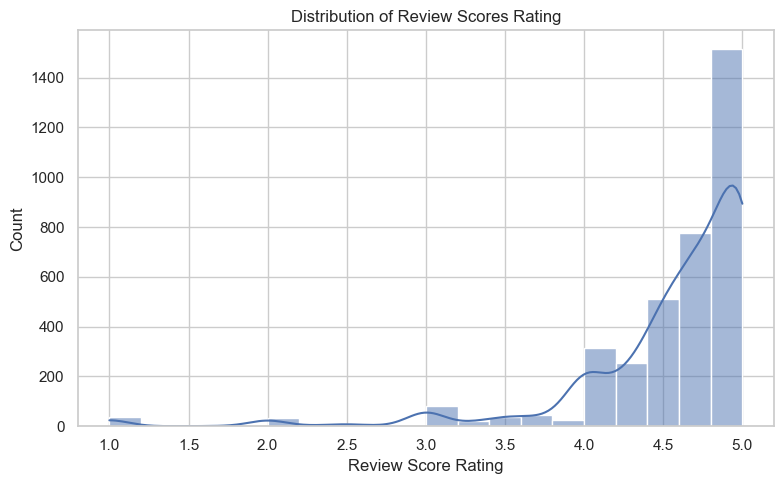

In [7]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set plot style
sns.set(style="whitegrid")

# Drop missing values in review_scores_rating
ratings = df_list['review_scores_rating'].dropna()

# Plot histogram
plt.figure(figsize=(8, 5))
sns.histplot(ratings, bins=20, kde=True)

plt.title("Distribution of Review Scores Rating")
plt.xlabel("Review Score Rating")
plt.ylabel("Count")
plt.tight_layout()
plt.show()

## Initialize and test LLM API

In [3]:
from ccai9012 import llm_utils, viz_utils

In [11]:
# Input API key
api_key = llm_utils.get_deepseek_api_key()

Enter your DEEPSEEK_API_KEY:  ········


In [13]:
# initialize LLM
llm = llm_utils.initialize_llm()

In [21]:
# Test connection
test = ["Is 9.9 or 9.11 bigger?"]
llm_utils.ask_llm(test)


📌 Prompt:
['Is 9.9 or 9.11 bigger?']

Let's compare the two numbers: **9.9** and **9.11**.

---

### Step 1: Compare the whole number part
Both numbers have the same whole number part: **9**.

---

### Step 2: Compare the decimal part
- **9.9** means \( 9 + \frac{9}{10} \) or \( 9.90 \) if we write it with two decimal places.
- **9.11** means \( 9 + \frac{11}{100} \).

---

### Step 3: Align decimal places for easier comparison
Write both numbers with the same number of decimal places (two):

\[
9.90 \quad\text{vs}\quad 9.11
\]

Now compare digit by digit after the decimal point:

- Tenths place: \( 9 \) (from 9.90) vs \( 1 \) (from 9.11) → \( 9 > 1 \)

So **9.90 > 9.11**.

---

### Step 4: Conclusion
\[
9.9 > 9.11
\]

---

\[
\boxed{9.9}
\]



## Structure output using LLM

In [15]:
test_csv = "output/test.csv"
test = df_review[:5]
test_result = llm_utils.analyze_airbnb_reviews(test, llm, test_csv, max_reviews=5)

100%|█████████████████████████████████████████████| 5/5 [00:55<00:00, 11.12s/it]


Saved 5 analyzed reviews to output/test.csv


In [45]:
test_result

,listing_id,review_id,date,review_text,overall_impression,decision_tags,location_opinion,location_comment,facility_opinion,facility_comment,host_opinion,host_comment
0,103760,352385,2011-07-04,This apartment is in a fabulous location - wal...,positive,"fabulous location, spotlessly clean, great hos...",positive,"The apartment is in a fabulous location, walk ...",positive,The place was spotlessly clean.,positive,Brendan was very easy to deal with and quite f...
1,103760,390313,2011-07-23,The apartment is very clean and has everything...,positive,"clean room, great location, well-equipped faci...",positive,The area is safe and super convenient with Air...,positive,"The apartment is very clean, well-organized, a...",positive,The guest would stay at Brendan's apartment ag...
2,103760,360538,2011-07-08,Pretty good little apartment. Just a really gr...,positive,"great location, comfortable beds, AC in all ro...",positive,Just a really great location.,positive,"Comfortable beds and AC in all the rooms, no f...",neutral,No specific mention of the host.
3,103760,322244,2011-06-19,We had a great experience staying in this apar...,positive,"clean room, convenient location, flexible host...",positive,Most convenient location in Central with a gre...,positive,"Very clean, quiet, with good wifi and televisi...",positive,"Brendan was very flexible and kind, allowing a..."
4,103760,378028,2011-07-17,The apartment was exactly the same as the phot...,positive,"clean room, cosy, great wifi, well-equipped",neutral,No specific mention of location.,positive,"The apartment was clean, cosy, had great wifi,...",neutral,No specific mention of the host.


In [46]:
airbnb_csv = "output/airbnb_reviews.csv"
all_result = llm_utils.analyze_airbnb_reviews(df_review, llm, airbnb_csv, max_reviews=150)

100%|███████████████████████████████████████████| 150/150 [29:46<00:00, 11.91s/it]


Saved 150 analyzed reviews to output/airbnb_reviews.csv


In [48]:
all_result.head()

,listing_id,review_id,date,review_text,overall_impression,decision_tags,location_opinion,location_comment,facility_opinion,facility_comment,host_opinion,host_comment
0,858590791586915213,1359897611805031041,2025-02-19,"Great stay, good location. Convenient",positive,"good location, convenient",positive,Great location.,neutral,No specific mention of facilities.,neutral,No specific mention of the host.
1,21165998,329469862,2018-09-29,Very convenient location. Host was kind enough...,positive,"convenient location, kind host, great restaura...",positive,Very convenient location with awesome restaura...,negative,Space is a bit crammed but that is typical for...,positive,Host was kind enough to give a free upgrade.
2,6348825,177165456,2017-08-02,除左细其他都ok,neutral,"small room, acceptable condition",neutral,No specific mention of location.,negative,The room is small.,neutral,No specific mention of host.
3,1328286909959687741,1419296659137513228,2025-05-12,This is just like home away from home.... loca...,positive,"home away from home, well-equipped kitchen, fa...",positive,"Location was just perfect, everything was arou...",positive,"The place is well equipped with a kitchen, sav...",positive,The host is very helpful and replies to each a...
4,31662448,705385625912739295,2022-08-31,Felt good. Rela made Indonesian rib soup and d...,positive,"great host, good location, delicious food",positive,Convenient for shopping and strolling.,neutral,No specific mention of facilities.,positive,Rela made Indonesian rib soup and dumplings fo...


In [49]:
all_result.columns

Index(['listing_id', 'review_id', 'date', 'review_text', 'overall_impression',
       'decision_tags', 'location_opinion', 'location_comment',
       'facility_opinion', 'facility_comment', 'host_opinion', 'host_comment'],
      dtype='object')

## Heatmap showing overall and aspect-wise impression

In [15]:
import folium

def plot_review_map(df, sentiment_field='overall_impression', map_center=[22.3193, 114.1694], zoom=12):
    """
    Plot Airbnb review locations on a map, color-coded by a given sentiment field.

    Args:
        df (pd.DataFrame): DataFrame containing at least 'latitude', 'longitude', and the sentiment_field.
        sentiment_field (str): The field to determine color (e.g., 'overall_impression', 'location_opinion').
        map_center (list): Map center as [lat, lon].
        zoom (int): Initial zoom level.
    
    Returns:
        folium.Map: Folium map object with plotted points.
    """
    # Define color mapping
    impression_color = {
        'positive': 'green',
        'neutral': 'gray',
        'negative': 'red'
    }

    # Create map
    m = folium.Map(location=map_center, zoom_start=zoom, tiles="CartoDB positron")

    # Plot each review
    for _, row in df.iterrows():
        lat, lon = row.get('latitude'), row.get('longitude')
        sentiment = row.get(sentiment_field, 'neutral')
        color = impression_color.get(sentiment, 'gray')

        if pd.notna(lat) and pd.notna(lon):
            folium.CircleMarker(
                location=[lat, lon],
                radius=4,
                color=color,
                fill=True,
                fill_color=color,
                fill_opacity=0.7,
                popup=f"{sentiment_field}: {sentiment}"
            ).add_to(m)

    return m

In [9]:
# Merge llm result with airbnb location info
all_result = pd.read_csv("output/airbnb_reviews.csv")
listing_df = pd.read_csv("data/listings.csv")
df = all_result.merge(
    listing_df[['id', 'latitude', 'longitude']], 
    left_on='listing_id',
    right_on='id',
    how='left'
)
df

,listing_id,review_id,date,review_text,overall_impression,decision_tags,location_opinion,location_comment,facility_opinion,facility_comment,host_opinion,host_comment,id,latitude,longitude
0,858590791586915213,1359897611805031041,2025-02-19,"Great stay, good location. Convenient",positive,"good location, convenient",positive,Great location.,neutral,No specific mention of facilities.,neutral,No specific mention of the host.,858590791586915213,22.278941,114.178875
1,21165998,329469862,2018-09-29,Very convenient location. Host was kind enough...,positive,"convenient location, kind host, great restaura...",positive,Very convenient location with awesome restaura...,negative,Space is a bit crammed but that is typical for...,positive,Host was kind enough to give a free upgrade.,21165998,22.317020,114.170670
2,6348825,177165456,2017-08-02,除左细其他都ok,neutral,"small room, acceptable condition",neutral,No specific mention of location.,negative,The room is small.,neutral,No specific mention of host.,6348825,22.316810,114.169680
3,1328286909959687741,1419296659137513228,2025-05-12,This is just like home away from home.... loca...,positive,"home away from home, well-equipped kitchen, fa...",positive,"Location was just perfect, everything was arou...",positive,"The place is well equipped with a kitchen, sav...",positive,The host is very helpful and replies to each a...,1328286909959687741,22.321130,114.167790
4,31662448,705385625912739295,2022-08-31,Felt good. Rela made Indonesian rib soup and d...,positive,"great host, good location, delicious food",positive,Convenient for shopping and strolling.,neutral,No specific mention of facilities.,positive,Rela made Indonesian rib soup and dumplings fo...,31662448,22.279270,114.180960
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145,868477717623572749,1126519461770304071,2024-04-03,非常舒適的環境，非常推薦,positive,"comfortable environment, highly recommended",neutral,No specific mention of location.,positive,The environment is described as very comfortable.,neutral,No specific mention of the host.,868477717623572749,22.276530,114.172698
146,880286248297903810,897529016686942387,2023-05-23,"房東姐姐非常Nice,人也很好,位置也蠻好的,交通也很方便,房屋乾淨靚麗！下次還會繼續選擇這...",positive,"great host, convenient location, clean facility",positive,"位置也蠻好的,交通也很方便",positive,房屋乾淨靚麗,positive,"房東姐姐非常Nice,人也很好",880286248297903810,22.323183,114.160332
147,1039461007747208417,1314904142374860991,2024-12-19,Great location to travel around in Hong Kong.,positive,"great location, convenient travel",positive,Great location to travel around in Hong Kong.,neutral,No specific mention of facilities.,neutral,No specific mention of the host.,1039461007747208417,22.306468,114.166632
148,1065780526744493882,1166404331784459508,2024-05-28,It was my 2nd time staying at Helen’s in 2024....,positive,"clean and stylish, great host, decent view, th...",positive,The place has a decent view and patio.,positive,The place is clean and stylish with thoughtful...,positive,Helen is a sincere and welcoming host who goes...,1065780526744493882,22.282930,114.128270


In [33]:
# overall impression
m = plot_review_map(df, sentiment_field='overall_impression', map_center=[22.3193, 114.1694], zoom=12)
m

In [35]:
# location impression
plot_review_map(df, sentiment_field='location_opinion')

In [37]:
# facility impression
plot_review_map(df, sentiment_field='facility_opinion')

In [39]:
# host impression
plot_review_map(df, sentiment_field='host_opinion')

## Decision elements for the renter

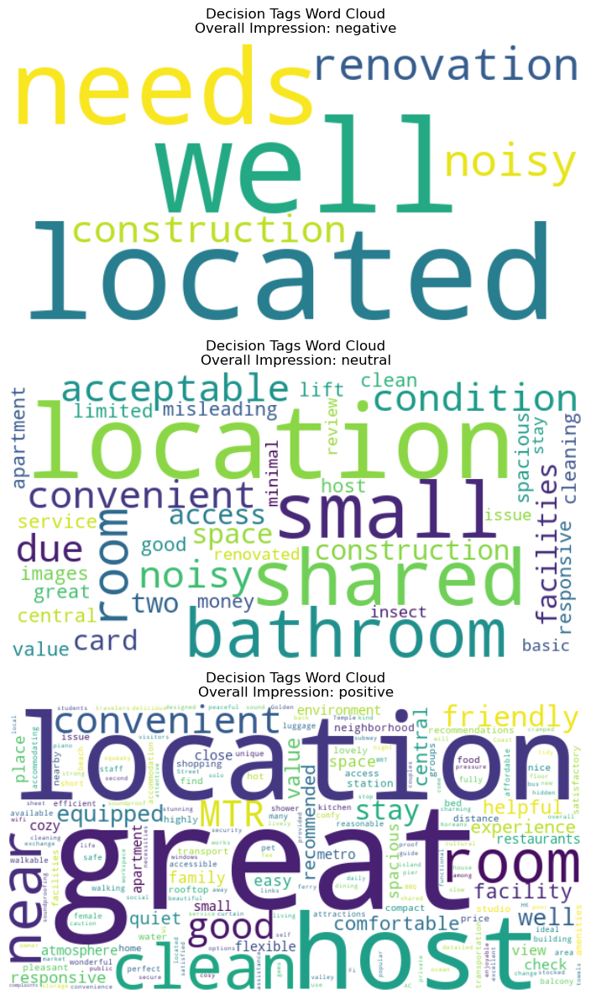

In [11]:
viz_utils.plot_wordclouds(all_result)

## What makes people (un)satified with different aspects of the rent?

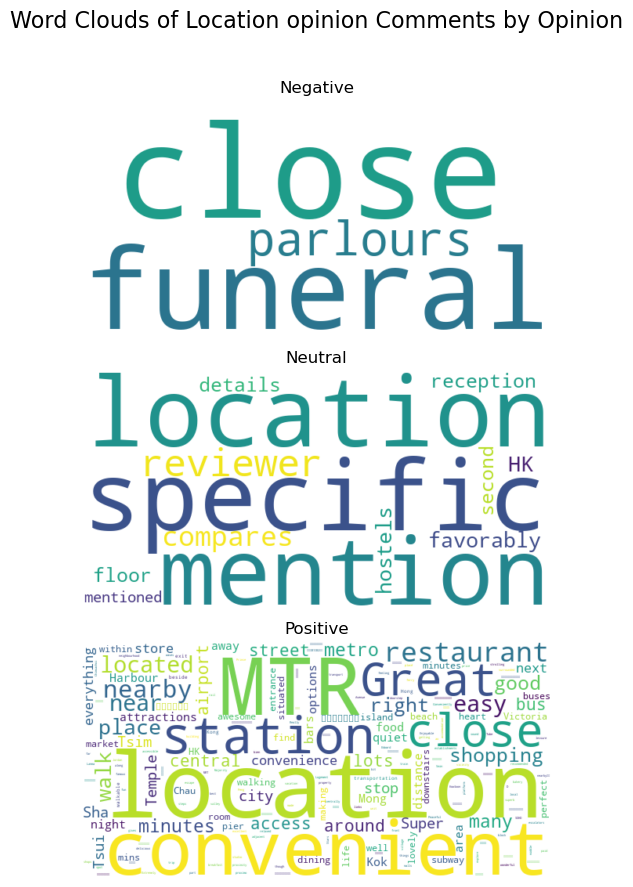

In [13]:
location_col = ['location_opinion']
viz_utils.plot_wordclouds_by_aspect_opinion(all_result, location_col)

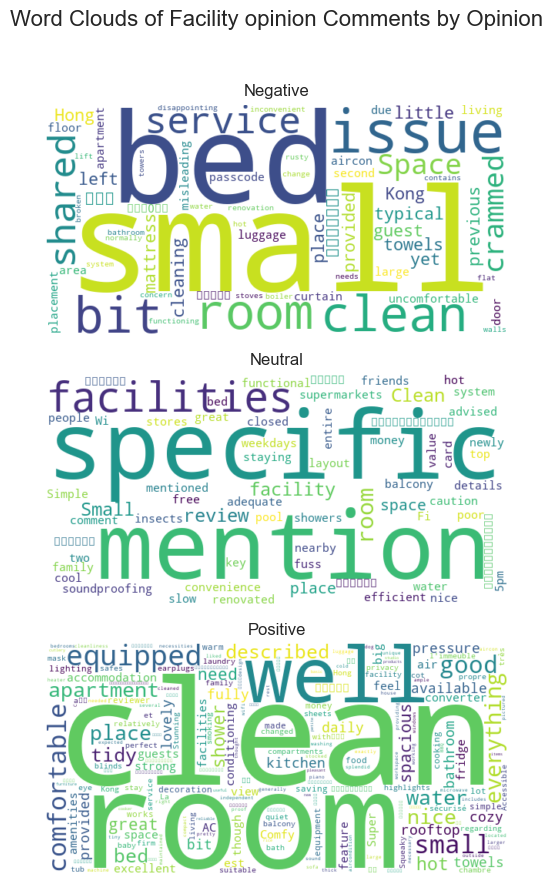

In [92]:
fal_col = ['facility_opinion']
plot_wordclouds_by_aspect_opinion(all_result, fal_col)

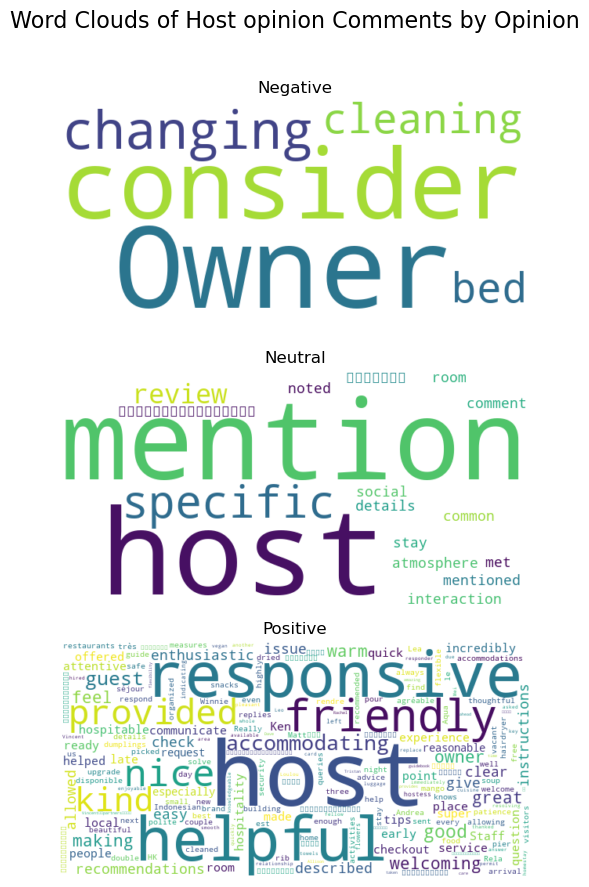

In [15]:
host_col = ['host_opinion']
viz_utils.plot_wordclouds_by_aspect_opinion(all_result, host_col)